<a href="https://colab.research.google.com/github/alamwasim/microstructure-alignment/blob/feature-matching/microstructure_alignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

Uninstalling opencv-python-4.1.2.30:
  Successfully uninstalled opencv-python-4.1.2.30
     |████████████████████████████████| 30.6MB 140kB/s 
     |████████████████████████████████| 14.5MB 324kB/s 
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: tensorflow 2.3.0 has requirement numpy<1.19.0,>=1.16.0, but you'll have numpy 1.19.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.18.5
    Uninstalling numpy-1.18.5:
      Successfully uninstalled numpy-1.18.5
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:


In [ ]:
# Restarting Runtime
import os
os.kill(os.getpid(), 9)

In [1]:
import pandas as pd
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import imutils

In [2]:
cv2.__version__

'3.4.2'

In [3]:
# !wget https://pns2019.github.io/images/Lenna.png

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [6]:
PATH_OF_DATA= """/content/gdrive/'My Drive'/'ML microstructure alignment'/"""
!ls {PATH_OF_DATA}

26.jpg	27.jpg


In [7]:
!cp '/content/gdrive/My Drive/ML microstructure alignment/26.jpg' "26.jpg"
!cp '/content/gdrive/My Drive/ML microstructure alignment/27.jpg' "27.jpg"

In [8]:
img26 = cv2.imread('26.jpg',0)
img27 = cv2.imread('27.jpg',0)

In [9]:
img26.shape, img27.shape

((1536, 2048), (1536, 2048))

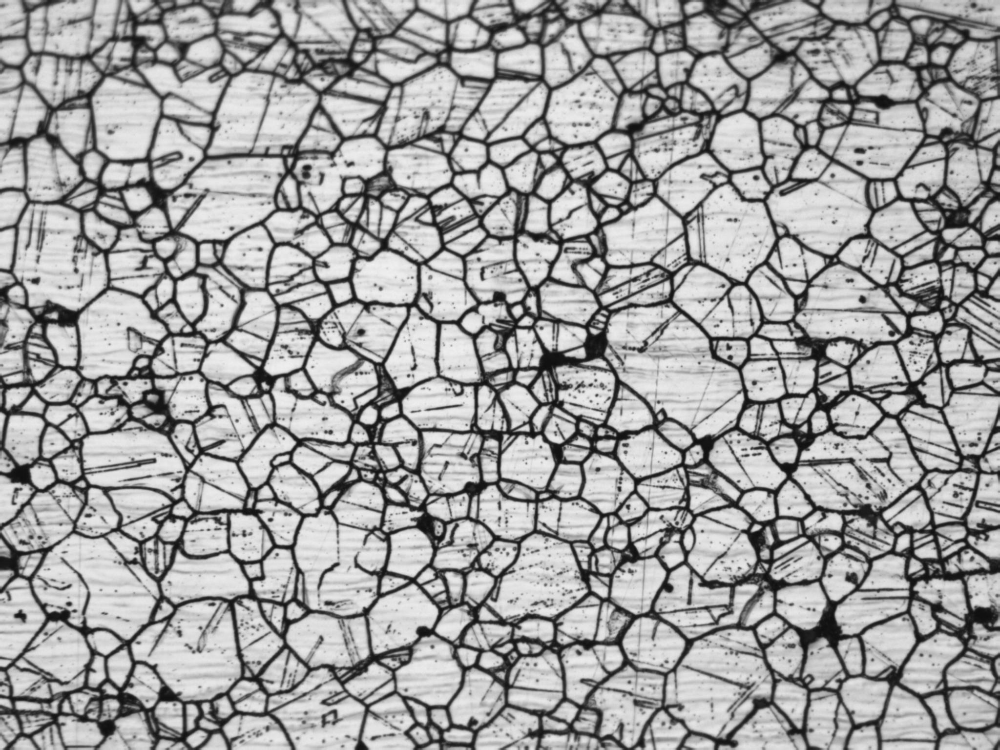

In [8]:
cv2_imshow(img26)

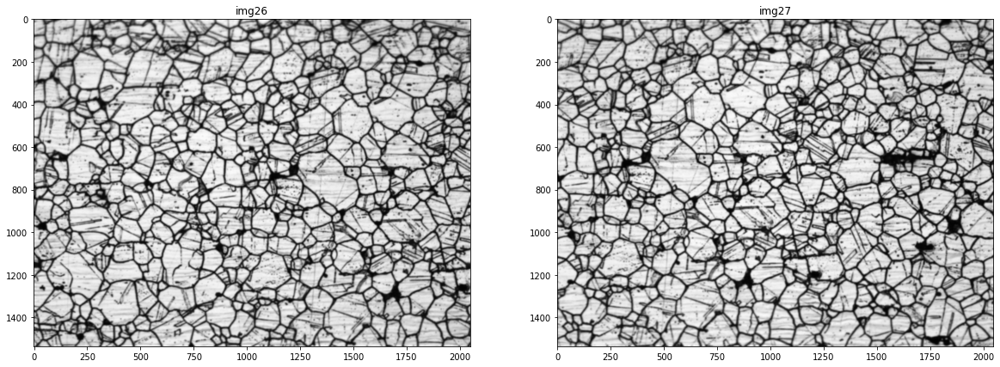

In [8]:
# Show the image with cv2_imshow
# cv2_imshow(img26)
#Show the image with matplotlib
# plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
fig, (ax1, ax2,) = plt.subplots(figsize=(20, 20), ncols=2)
ax1.imshow(img26, cmap = 'gray', interpolation = 'bicubic')
ax2.imshow(img27, cmap = 'gray', interpolation = 'bicubic')
ax1.title.set_text('img26')
ax2.title.set_text('img27')
plt.show()

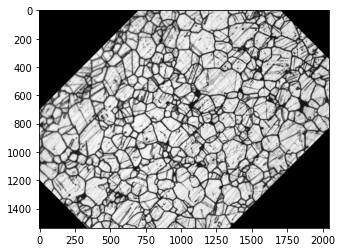

In [28]:
img = img26.copy()
rows,cols = img.shape
M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)
dst = cv2.warpAffine(img,M,(cols,rows))
plt.imshow(dst,cmap='gray')

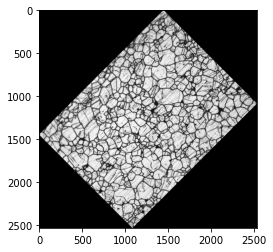

In [24]:
plt.imshow(imutils.rotate_bound(img26,-45),cmap='gray')

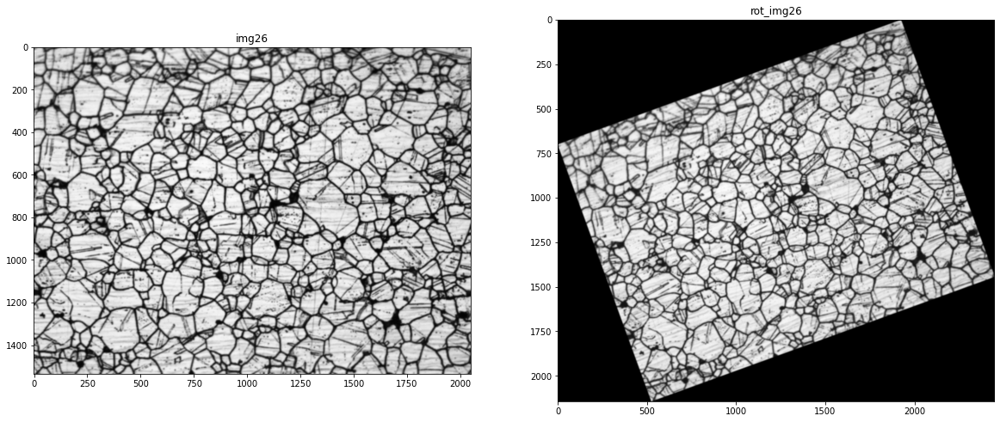

In [10]:
angle=-20
rot_img=imutils.rotate_bound(img26,angle)
fig, (ax1, ax2,) = plt.subplots(figsize=(20, 20), ncols=2)
ax1.imshow(img26, cmap = 'gray', interpolation = 'bicubic')
ax2.imshow(rot_img, cmap = 'gray', interpolation = 'bicubic')
ax1.title.set_text('img26')
ax2.title.set_text('rot_img26')
plt.show()

In [12]:
def compare_features(img1,img2,img1_name="img1",img2_name="img2",threshold=30000):
  # Create SURF object. You can specify params here or later.
  # Here I set Hessian Threshold to 400
  surf = cv2.xfeatures2d.SURF_create()
  surf.setHessianThreshold(threshold)
  print( "Threshold",surf.getHessianThreshold() )
  # Find keypoints and descriptors directly
  kp1, des1 = surf.detectAndCompute(img1,None)
  kp2, des2 = surf.detectAndCompute(img2,None)
  print( "No. of keypoints detected for "+img1_name, len(kp1) )
  print( "No. of keypoints detected for "+img2_name, len(kp2) )
  img_kp1 = cv2.drawKeypoints(img1,kp1,None,(255,0,0),4)
  img_kp2 = cv2.drawKeypoints(img2,kp2,None,(255,0,0),4)
  #Plot Image
  fig, (ax1, ax2,) = plt.subplots(figsize=(20, 20), ncols=2)
  ax1.imshow(img_kp1, cmap = 'gray', interpolation = 'bicubic')
  ax2.imshow(img_kp2, cmap = 'gray', interpolation = 'bicubic')
  ax1.title.set_text(img1_name)
  ax2.title.set_text(img2_name)
  plt.show()


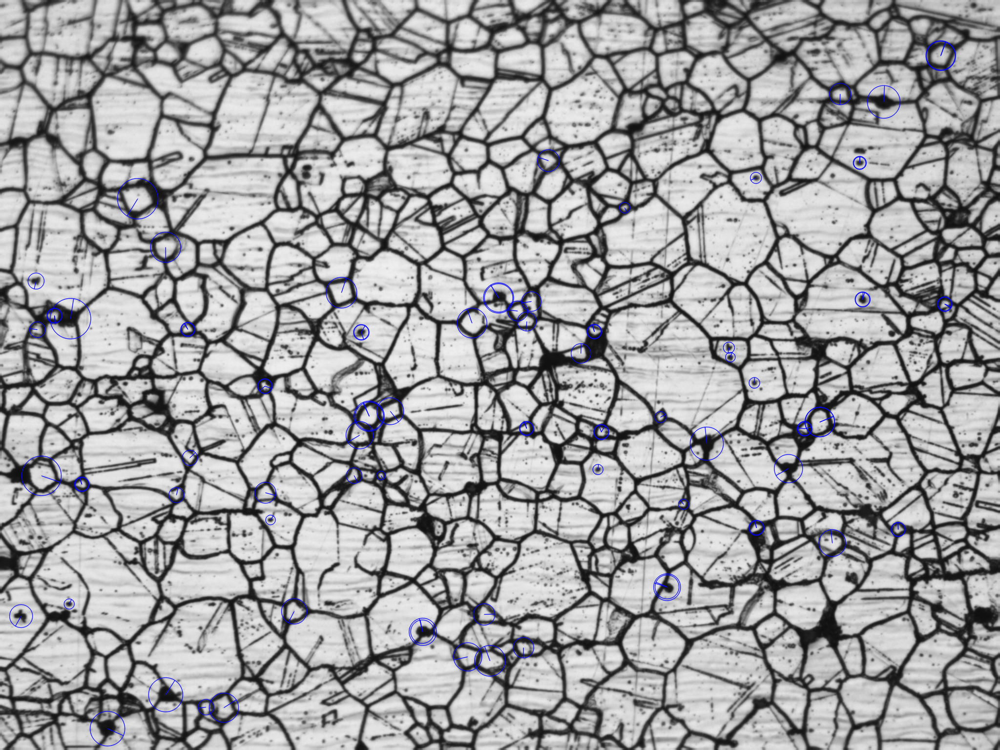

In [33]:
surf = cv2.xfeatures2d.SURF_create()
print( surf.getHessianThreshold() )
surf.setHessianThreshold(30000)
kp, des = surf.detectAndCompute(img26,None)
print( len(kp) )
img2 = cv2.drawKeypoints(img26,kp,None,(255,0,0),4)
cv2_imshow(img2)

101


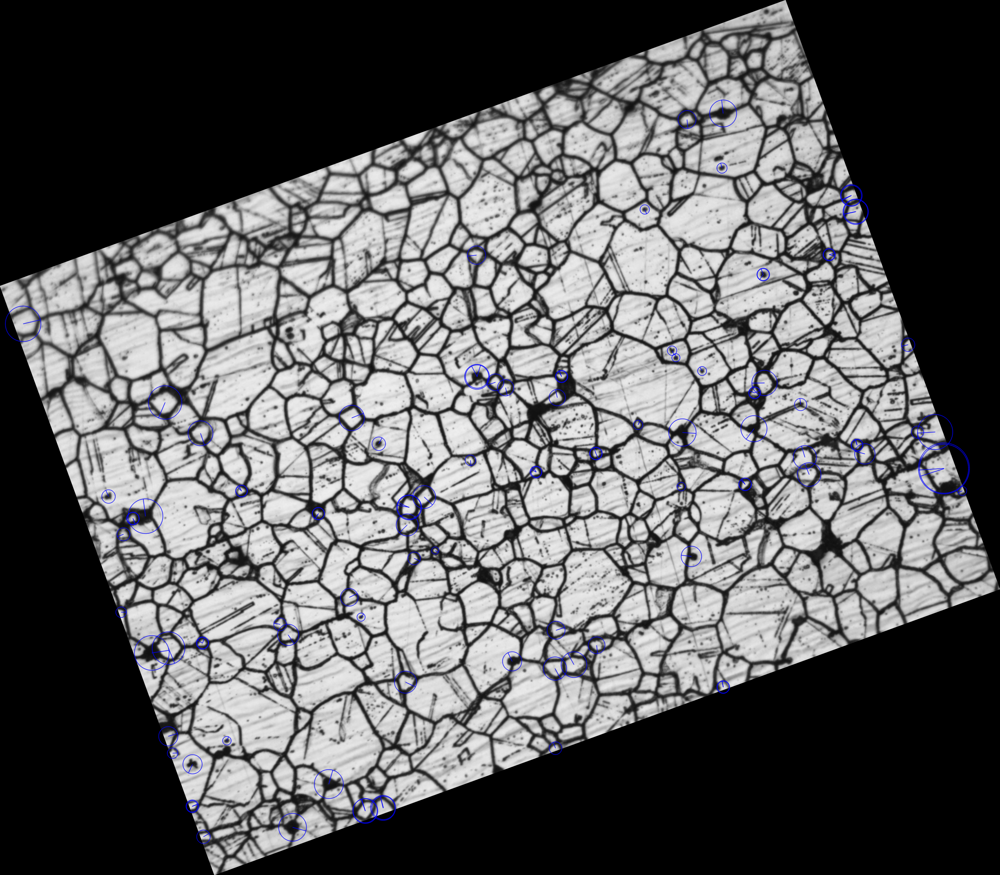

In [34]:
kp, des = surf.detectAndCompute(rot_img,None)
print( len(kp) )
img2 = cv2.drawKeypoints(rot_img,kp,None,(255,0,0),4)
cv2_imshow(img2)

Threshold 30000.0
No. of keypoints detected for img26 85
No. of keypoints detected for Rotated_img26 101


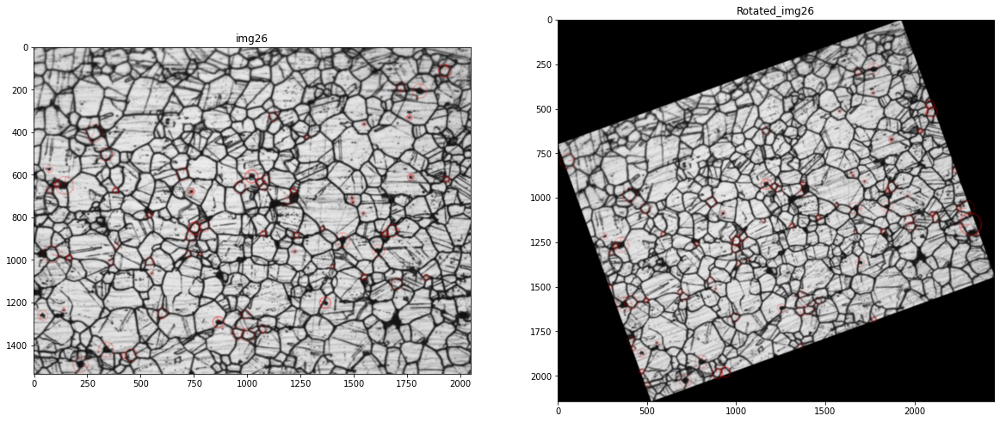

In [43]:
compare_features(img26,rot_img,"img26","Rotated_img26")

Threshold 30000.0
No. of keypoints detected for img26 85
No. of keypoints detected for rescaled_img26 20


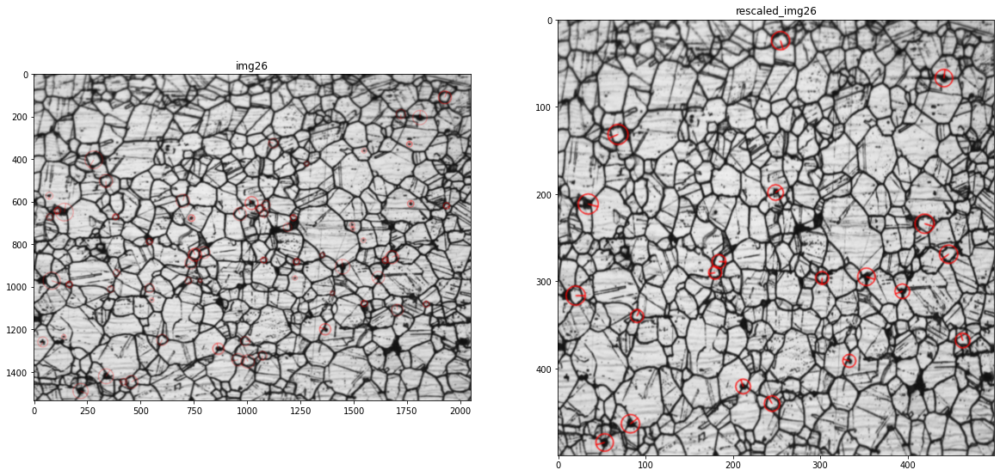

In [44]:
scaled_img=cv2.resize(img26,(500,500))
compare_features(img26,scaled_img,"img26","rescaled_img26")

Threshold 30000.0
No. of keypoints detected for img26 85
No. of keypoints detected for img27 87


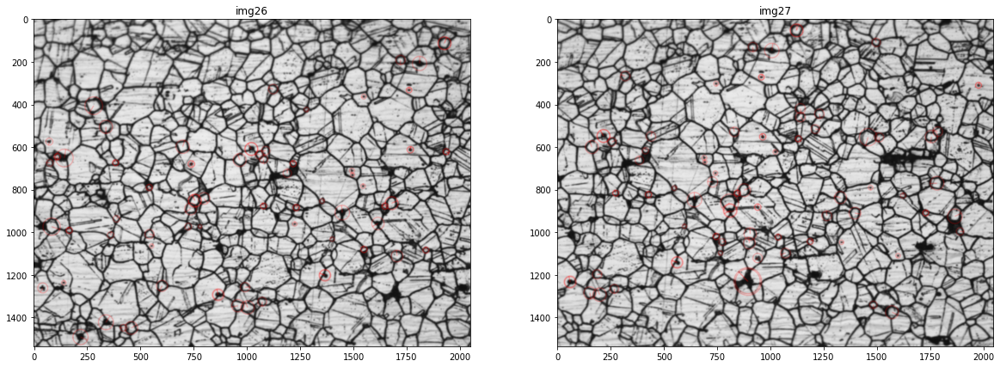

In [45]:
compare_features(img26,img27,"img26","img27")

In [11]:
def match_img_knn(queryImage, trainingImage, thread=0):
    sift = cv2.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(queryImage, None)
    kp2, des2 = sift.detectAndCompute(trainingImage, None)
    #print(len(kp1))
    FLANN_INDEX_KDTREE = 1
    indexParams = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    searchParams = dict(checks=50)
    flann = cv2.FlannBasedMatcher(indexParams, searchParams)
    matches = flann.knnMatch(des1, des2, k=2)

    good = []
    matchesMask = [[0, 0] for i in range(len(matches))]
    for i, (m, n) in enumerate(matches):
        if m.distance < 0.7*n.distance:  
            matchesMask[i] = [1, 0]
            good.append(m)
    print(len(kp1),len(kp2),len(matches),len(good))

    s = sorted(good, key=lambda x: x.distance)

    drawParams=dict(matchColor=(0,0,255),singlePointColor=(255,0,0),matchesMask=matchesMask,flags=0) 
    resultimage=cv2.drawMatchesKnn(queryImage,kp1,trainingImage,kp2,matches,None,**drawParams)
    plt.imshow(resultimage)
    '''
    if len(good) > thread:
        maxLoc = kp2[s[0].trainIdx].pt
        #print(maxLoc)
        return (int(maxLoc[0]), int(maxLoc[1]))
    else:
        return (0, 0) 
        '''
    return good

17235 17856 17235 6759


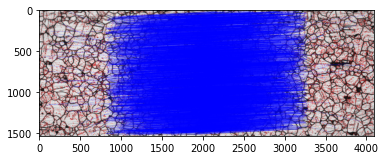

In [12]:
good=match_img_knn(img26,img27)

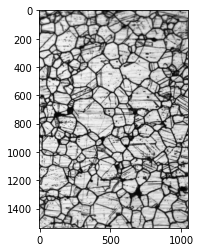

In [63]:
plt.imshow(img26[:,1000:],cmap='gray')

In [95]:
MIN_MATCH_COUNT = 10
img1 = img26.copy()        # queryImage
img2 = imutils.rotate_bound(img27,-20) # trainImage
# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)
# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)
sorted_good = sorted(good, key=lambda x: x.distance)

In [96]:
src_pts = np.float32([ kp1[m.queryIdx].pt for m in sorted_good ])
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in sorted_good ])

In [97]:
dx=[]
dy=[]
for i in range(len(src_pts)):
  dx.append(src_pts[i][0]-dst_pts[i][0])
  dy.append(src_pts[i][1]-dst_pts[i][1])

In [98]:
np.mean(dx),np.std(dx),np.mean(dy),np.std(dy)

(570.1093, 185.97237, -371.83978, 133.47974)

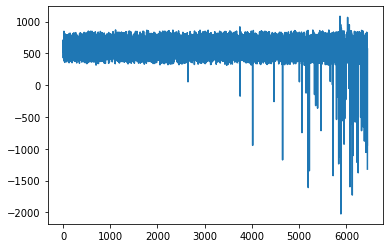

In [99]:
plt.plot(dx)

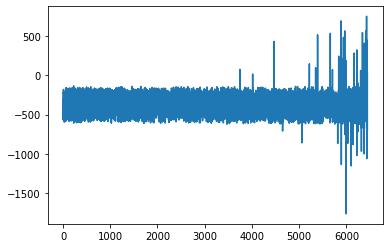

In [100]:
plt.plot(dy)

In [101]:
src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

In [102]:
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)

In [103]:
M,len(mask)

(array([[ 9.45758573e-01,  3.43253896e-01, -7.82853470e+02],
        [-3.40877583e-01,  9.43519173e-01,  9.17494002e+02],
        [ 2.41803178e-06,  1.52290164e-07,  1.00000000e+00]]), 6446)

In [104]:
matchesMask = mask.ravel().tolist()

In [105]:
h,w = img1.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
img2 = cv2.polylines(img2,[np.int32(dst)],True,255,3, cv2.LINE_AA)

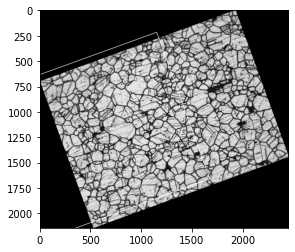

In [106]:
plt.imshow(img2,cmap='gray')

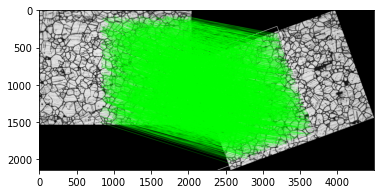

In [107]:
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
img3 = cv2.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)
plt.imshow(img3, 'gray')

In [119]:
dst

array([[[-782.85345,  917.494  ]],

       [[-255.89893, 2365.243  ]],

       [[1671.3457 , 1659.418  ]],

       [[1147.4348 ,  218.6354 ]]], dtype=float32)

In [118]:
dst.reshape(4,2)

array([[-782.85345,  917.494  ],
       [-255.89893, 2365.243  ],
       [1671.3457 , 1659.418  ],
       [1147.4348 ,  218.6354 ]], dtype=float32)

In [121]:
(tl, tr, br, bl) = dst.reshape(4,2)
# compute the width of the new image, which will be the
# maximum distance between bottom-right and bottom-left
# x-coordiates or the top-right and top-left x-coordinates
widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
maxWidth = max(int(widthA), int(widthB))
# compute the height of the new image, which will be the
# maximum distance between the top-right and bottom-right
# y-coordinates or the top-left and bottom-left y-coordinates
heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
maxHeight = max(int(heightA), int(heightB))
# now that we have the dimensions of the new image, construct
# the set of destination points to obtain a "birds eye view",
# (i.e. top-down view) of the image, again specifying points
# in the top-left, top-right, bottom-right, and bottom-left
# order
dst = np.array([
	[0, 0],
	[maxWidth - 1, 0],
	[maxWidth - 1, maxHeight - 1],
	[0, maxHeight - 1]], dtype = "float32")
transform=cv2.getPerspectiveTransform(pts,dst)

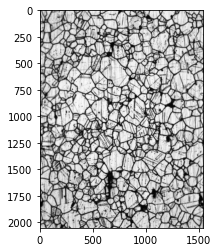

In [126]:
plt.imshow(cv2.warpPerspective(img27, transform, (maxWidth, maxHeight)),'gray')

NameError: ignored

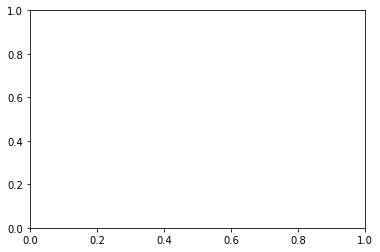

In [108]:
fig = plt.gcf()
ax = fig.gca()
ax.imshow(img,cmap='gray',alpha=0.8)
nrows,ncols=template_img.shape
ax.imshow(template_img,alpha=0.5,extent=[dx,ncols+dx,nrows+dy,dy])
ax.set_xlim(dx-10,img.shape[1]+10)
ax.set_ylim(img.shape[0]+10,dy-10)
fig.set_size_inches(15,10)

In [ ]:
 fig.savefig("aligned.png")

In [ ]:
def show_images(images, cols = 1, titles = None):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()